# 勾配法によるパラメータ推定

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.collections
import matplotlib.animation
import matplotlib.colors
from IPython.display import HTML

## パラメータ推定の閉じた式

まず、閉じた式（解析解）に基づく回帰問題のパラメータ推定法を復習する。$N$件の事例からなる訓練データ$\mathcal{D}$があり、各事例は$d$個の説明変数と$1$個の目的変数で表現されているとする。$d$個の説明変数をベクトル$\pmb{x} = (x_1, x_2, \dots, x_d)^\top \in \mathbb{R}^{d}$、目的変数を$y \in \mathbb{R}$で表すことにすると、訓練データ$\mathcal{D}$は次式で表される。
\begin{align}
\mathcal{D} = \{(\pmb{x}_i, y_i)\}_{i=1}^{N}
\end{align}

説明変数を行ベクトルとして$N$個縦に並べた計画行列$\pmb{X} \in \mathbb{R}^{N \times d}$を導入する。
\begin{align}
\pmb{X}
= \begin{pmatrix}
\pmb{x}_1^\top \\
\pmb{x}_2^\top \\
\vdots \\
\pmb{x}_N^\top \\
\end{pmatrix}
= \begin{pmatrix}
X_{1,1} & X_{1,2} & \dots & X_{1,d} \\
X_{2,1} & X_{2,2} & \dots & X_{2,d} \\
\vdots & \vdots & \ddots & \vdots \\
X_{N,1} & X_{N,2} & \dots & X_{N,d} \\
\end{pmatrix}
\end{align}
また、目的変数$y_i$を$N$個縦に並べたベクトル$\pmb{y} \in \mathbb{R}^{N}$を導入する。
\begin{align}
\pmb{y}
= \begin{pmatrix}
y_1 \\
y_2 \\
\vdots \\
y_N \\
\end{pmatrix}
\end{align}

$d$個の説明変数に対応する重み（パラメータ）を$d$次元のベクトル$\pmb{w} \in \mathbb{R}^{d}$で表現する。
\begin{align}
\pmb{w}
= \begin{pmatrix}
w_1 \\
w_2 \\
\vdots \\
w_d \\
\end{pmatrix}
\end{align}

$N$個の目的変数の予測値は次のように計算される。
\begin{align}
\pmb{\hat{y}} = \pmb{X} \pmb{w} = \begin{pmatrix}
X_{1,1} & X_{1,2} & \dots & X_{1,d} \\
X_{2,1} & X_{2,2} & \dots & X_{2,d} \\
\vdots & \vdots & \ddots & \vdots \\
X_{N,1} & X_{N,2} & \dots & X_{N,d} \\
\end{pmatrix}
\begin{pmatrix}
w_1 \\
w_2 \\
\vdots \\
w_d
\end{pmatrix}
= \begin{pmatrix}
X_{1,1} w_1 + X_{1,2} w_2 + \dots + X_{1,d} w_d \\
X_{2,1} w_1 + X_{2,2} w_2 + \dots + X_{2,d} w_d \\
\vdots \\
X_{N,1} w_1 + X_{N,2} w_2 + \dots + X_{N,d} w_d \\
\end{pmatrix}
\end{align}

正則化を行わない場合、目的関数は、
\begin{align}
\hat{L}_{\mathcal{D}}(\pmb{w}) = \|\pmb{y} - \pmb{\hat{y}}\|^2 = \|\pmb{y} - \pmb{X}\pmb{w}\|^2
\end{align}
目的関数を$\pmb{w}$に関して偏微分して整理すると、
\begin{align}
\nabla \hat{L}_{\mathcal{D}}(\pmb{w}) = \frac{\partial \hat{L}_{\mathcal{D}}(\pmb{w})}{\partial \pmb{w}} &= 2\pmb{X}^\top (\pmb{\hat{y}} - \pmb{y}) = 2\pmb{X}^\top (\pmb{X}\pmb{w} - \pmb{y})
\end{align}
目的関数を最小にするパラメータ$\pmb{w}^{*}$は、この偏微分を$0$とおいた解として、次式で求まる。
\begin{align}
\pmb{w}^{*} &= (\pmb{X}^\top \pmb{X})^{-1}\pmb{X}^\top \pmb{y}
\end{align}

リッジ回帰（$L_2$正則化付き回帰）の場合、目的関数は、
\begin{align}
J_{\mathcal{D}}(\pmb{w}) &= \|\pmb{y} - \pmb{\hat{y}}\|^2 + \alpha \|\pmb{w}\|^2 = \|\pmb{y} - \pmb{X}\pmb{w}\|^2 + \alpha \|\pmb{w}\|^2
\end{align}
ただし、$\alpha$ $(\geq 0)$は正則化の効果を指定するハイパーパラメータである。目的関数を$\pmb{w}$に関して偏微分して整理すると、
\begin{align}
\nabla J_{\mathcal{D}}(\pmb{w}) = \frac{\partial J_{\mathcal{D}}(\pmb{w})}{\partial \pmb{w}} &= 2\pmb{X}^\top (\pmb{\hat{y}} - \pmb{y}) + 2 \alpha \pmb{w} = 2\pmb{X}^\top (\pmb{X}\pmb{w} - \pmb{y}) + 2 \alpha \pmb{w} \\
\end{align}
目的関数を最小にするパラメータ$\pmb{w}^{*}$は、この偏微分を$0$とおいた解として、次式で求まる。
\begin{align}
\pmb{w}^{*} &= (\pmb{X}^\top \pmb{X} + \alpha \pmb{I})^{-1}\pmb{X}^\top \pmb{y}
\end{align}

## 閉じた式の問題点

コンピュータ上で閉じた式を使ってパラメータ推定を行う際、いくつかの不都合が生じる。

1. **行列積の空間計算量が大きい**： $\pmb{X}^\top \pmb{X}$の計算結果は$d \times d$の行列となる。大規模な学習データを用いる場合、説明変数の数は膨大になる。例えば、$d=1,000,000$ (1M) であるとすると、$\pmb{X}^\top \pmb{X}$の計算結果は1T個の要素からなる行列となる。各要素を単精度の浮動小数点で表現した場合、4TBの記憶領域が必要である。
2. **逆行列の時間計算量が大きい**： コレスキー分解を用いて$d \times d$の行列の逆行列を計算する場合、時間計算量は$\mathcal{O}(d^3)$である。これも大規模な学習データを用いる際に問題となる。

また、回帰の場合は解析解を求めること（目的関数の微分を$0$とおいて解くこと）ができたが、教師あり学習では目的関数の微分を求めることができても、そこから**解析解を求めることができない**（解析的に解けない）ことが多い。閉じた式が求められない場合は、目的関数の勾配を用いて、数値計算（反復計算）によって目的関数を最小（極小）にするパラメータを求めることになる。ここでは、回帰、分類、深層ニューラルネットワークに至るまで汎用的に用いられるパラメータ推定法である**確率的勾配降下法**を紹介する。確率的勾配降下法は、最急降下法の一種であるので、まずは最急降下法を説明する。

## 最急降下法

### 最急降下法の更新式

回帰のパラメータ推定は、ある目的関数を最小にするような関数の入力、すなわちパラメータを求める問題に帰着した。この問題を解く汎用的な手法として、最急降下法を紹介する。まずは回帰の問題設定を忘れ、最急降下法の一般的な説明を行う。

$d$次元ベクトル$\pmb{x} \in \mathbb{R}^{d}$を受け取り、スカラー値を返す関数$y = f(\pmb{x})$がある。この関数$f(\pmb{x})$の極小値を与える$\pmb{x}^*$を求めたい。**最急降下法**（**勾配法**とも呼ばれる）は、初期値$\pmb{x}^{(1)}$を出発点とし、以下の反復式を用いて初期値の近くの極小値の解$\pmb{x}^{(t)}$を更新していく。

$$
\begin{align}
\pmb{x}^{(t+1)} = \pmb{x}^{(t)} - \eta_t \nabla f(\pmb{x}^{(t)})
\end{align}
$$ (eq:update-formula)

ただし、$t = 1, 2, \dots$は反復の回数を表す変数、$\eta_t$は$t$回目の反復における**更新幅**（ステップサイズ、機械学習では**学習率**とも呼ばれる）である。極小値$\pmb{x}^{*}$が求まったところで反復を終了するが、その終了判定として以下の条件式などが用いられる（ただし、$\epsilon$は十分に小さい正の定数）。
\begin{align}
\left|\nabla f(\pmb{x})\right| < \epsilon
\end{align}
なお、関数$f(\pmb{x})$が凸関数である場合は、初期値の選び方によらず大域的な最小値を与える$\pmb{x}^{*}$を求めることができる。

最急降下法の更新幅$\eta_t$は、現在の解を勾配方向にどのくらい動かすかを決定する。更新幅$\eta_t$を大きくすると極小値に早く近づくかもしれないが、極小となる点を飛び越してしまい、最急降下法の挙動が発散し、解が求まらないこともある。更新幅$\eta_t$を小さくすると、最急降下法の挙動は安定するかもしれないが、極小値に近づくのが遅くなる。したがって、適切な更新幅を設定することはとても重要である。更新幅の設定法で最も単純なのは、反復の回数によらず一定の更新幅$\eta$にしてしまうことである（$\eta_t = \eta$）。しかし、この方法では$\eta$の値の決定に試行錯誤が必要である。実際には、直線探索（linear search）などの手法を用いて、合理的な更新幅$\eta_t$を動的に求めるとよいが、ここでは説明しない。

### 最急降下法の実行例

最も単純な例として、$x$を1次元とし、$xy$平面上で$y$の値が最小となる$x$を最急降下法で求める過程を説明する。
\begin{align}
f(x) &= 0.5 x^2 - 5x + 13.5 = \frac{1}{2}\left\{(x - 5)^2 + 2\right\} \\
f'(x) &= \frac{\partial f(x)}{\partial x} = x - 5
\end{align}

初期値$x_1 = 9$、更新幅は反復回数によらず$\eta_t = 0.5$に固定、反復の終了条件は$|f'(x)| < 10^{-4}$として、最急降下法の反復式を繰り返し適用する過程をアニメーションで示す。

In [2]:
def f(x):
    return 0.5 * (x ** 2 - 10 * x + 27)

def g(x):
    return 0.5 * (2 * x - 10)

def sd(f, g, x=0., eta=0.01, eps=1e-4):
    t = 1
    H = []
    while True:
        gx = g(x)
        H.append(dict(t=t, x=x, fx=f(x), gx=gx))
        if -eps < gx < eps:
            break
        x -= eta * gx
        t += 1
    return H

def draw_step(h, ax, eta):
    artist = []
    xt, yt, gt = h['x'], h['fx'], h['gx']    
    y0 = yt - xt * gt
    y10 = (10 - xt) * gt + yt

    lines = [
        [(0, y0), (10, y10)],
        [(xt, yt), (xt - gt * eta, yt)]
    ]
    lc = matplotlib.collections.LineCollection(lines, color=['b', 'g'], lw=1)
    artist.append(plt.gca().add_collection(lc))
    artist.append(plt.vlines([xt], 0, 10, "red", linestyles='dashed', label=r"$x$"))
    artist.extend(ax.plot([xt], [yt], 'ro'))
    artist.append(ax.text(xt - gt * eta * 0.5, yt + 0.3, "${:.5f}$".format(gt * eta), ha='center'))
    artist.append(ax.text(xt + 0.2, yt - 0.5, str(xt)))
    return artist

H = sd(f, g, x = 9, eta=0.5)
x = np.linspace(0, 10, 1000)

fig, ax = plt.subplots(dpi=100, figsize=(6, 6))
ax.plot(x, f(x), 'black')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)
ax.set_aspect('equal')
ax.grid()

artists = []
for h in H:
    artists.append(draw_step(h, ax, eta=0.5))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

$x^{(1)} = 9$のとき、$f'(x^{(1)}) = (9 - 5) = 4$であるから、次式で$x^{(2)}$が計算される。
\begin{align}
x^{(2)} = x^{(1)} - \eta_1 f'(x^{(1)}) = 9 - 0.5 \times 4 = 9 - 2 = 7
\end{align}
上の可視化では、現在の$x^{(t)}$に関して、勾配$f'(x^{(t)})$を接線で、$x^{(t)}$が受ける変化量を横線で示している。反復を繰り返すことで、$f(x^{(t)})$の値が最小値に近づくとともに、$f'(x^{(t)})$の値が$0$に近づき、$x^{(t)}$が受ける変化量が小さくなっていくことが確認できる。

### 更新式の振る舞い

$x$が１次元のときの最急降下法の振る舞いは分かりやすい。

+ 傾き$f'(x^{(t)})$が正ならば$x^{(t)}$は減少する方向、負ならば$x^{(t)}$は増加する方向に動く
+ 傾き$f'(x^{(t)})$が急（絶対値が大きい）ならば$x^{(t)}$が受ける変化量は大きくなり、傾きが緩やか（絶対値が小さい）ならば$x^{(t)}$が受ける変化量は小さくなる

$\pmb{x}$が多次元のときの振る舞いは、関数$f(\pmb{x})$のテーラー展開を考えるとよい。関数$f(\pmb{x})$の$\pmb{x}$のまわりの１次のテーラー展開（１次近似）は、$\pmb{x}$に対する微小な変化ベクトルを$\pmb{\delta}$とすると、
\begin{align}
f(\pmb{x} + \pmb{\delta}) \approx f(\pmb{x}) + f'(\pmb{x})^\top \pmb{\delta}
\end{align}

変化ベクトル$\pmb{\delta} = -\eta_t f'(\pmb{x}^{(t)})$として１次のテーラー展開を導入すると、
\begin{align}
f\left(\pmb{x}^{(t)} - \eta_t f'(\pmb{x}^{(t)})\right)
&\approx f(\pmb{x}^{(t)}) + f'(\pmb{x}^{(t)})^\top  \left( -\eta_t f'(\pmb{x}^{(t)}) \right) \\
&= f(\pmb{x}^{(t)}) - \eta_t \underbrace{f'(\pmb{x}^{(t)})^\top f'(\pmb{x}^{(t)})}_{\geq 0} \leq f(\pmb{x}^{(t)})
\end{align}

最急降下法の更新式{eq}`eq:update-formula`より、上式の左辺は$f(\pmb{x}^{(t+1)})$であるから、以下の不等式が成り立つ。
\begin{align}
f(\pmb{x}^{(t+1)}) \leq f(\pmb{x}^{(t)})
\end{align}

$f(\pmb{x}^{(t)})$が極小値に到達していない間は$f'(\pmb{x}^{(t)})^\top f'(\pmb{x}^{(t)}) > 0$、更新幅は$\eta_t > 0$であるから、反復が進むにつれて$f(\pmb{x}^{(t)})$の値が小さくなることが確認できる。ただし、テーラー展開による近似が成立するには、変化ベクトル$\pmb{\delta} = -\eta_t f'(\pmb{x}^{(t)})$が十分に小さくなければならない。最急降下法では変化ベクトル$\pmb{\delta}$の変化量を更新幅$\eta_t$で調整しているので、この値を十分に小さくしておけばよい。ところが、$\eta_t$が小さすぎると１回の更新で$\pmb{x}$が動く距離が減るため、解に到達するまでの反復の回数が多くなる。一方で、$\eta_t$が大きすぎると１次近似からの乖離が大きくなるため、更新後の$f(\pmb{x}^{(t+1)})$の値が元の値$f(\pmb{x}^{(t)})$よりも大きくなるかもしれない。

さて、最急降下法で$f(x) = 0.5 x^2 - 5x + 13.5$を最小化するプログラムを以下に示す。このプログラムは解を求めるだけではなく、各反復における$x^{(t)}, f(x^{(t)}), f'(x^{(t)})$の値をリスト`H`に記録している。

In [3]:
def f(x):
    return 0.5 * x ** 2 - 5 * x + 13.5

def g(x):
    return x - 5

def sd(f, g, x=0., eta=0.01, eps=1e-4):
    t = 1
    H = []
    while True:
        gx = g(x)
        H.append(dict(t=t, x=x, fx=f(x), gx=gx))
        if -eps < gx < eps:
            break
        x -= eta * gx
        t += 1
    return H

In [4]:
H = sd(f, g, x = 9, eta=0.5)
H[-1]

{'t': 17,
 'x': 5.00006103515625,
 'fx': 1.0000000018626451,
 'gx': 6.103515625e-05}

反復の回数を横軸にとり、目的関数の値を縦軸に示したグラフを書いてみると、反復が進むに連れて目的関数の値が減少することが確認できる。

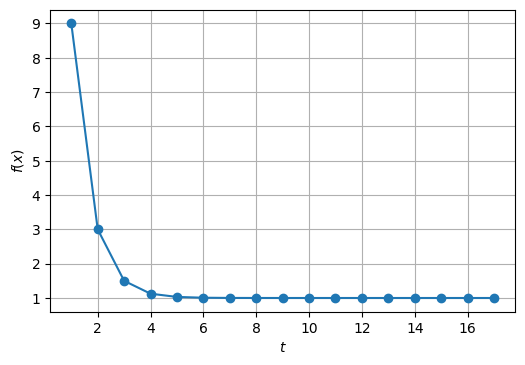

In [5]:
fig, ax = plt.subplots(dpi=100)
ax.plot(
    [h['t'] for h in H],
    [h['fx'] for h in H],
    'o-'
    )
ax.set_xlabel('$t$')
ax.set_ylabel('$f(x)$')
ax.grid()

## 最急降下法によるパラメータ推定

最急降下法を使って回帰のパラメータを求める。最急降下法の説明では「目的関数の値$f(\pmb{x})$を最小にする$\pmb{x}$を求める」という問題設定であった、回帰では「目的関数$\hat{L}_{\mathcal{D}}(\pmb{w})$の値を最小にする$\pmb{w}$を求める」という問題設定であることに注意が必要である（つまり、変数を$\pmb{x} \to \pmb{w}$と置換、目的関数を$f(\pmb{x}) \to \hat{L}_{\mathcal{D}}(\pmb{w})$して考えることになる）。

目的関数$\hat{L}_{\mathcal{D}}(\pmb{w})$の勾配は、
\begin{align}
\nabla \hat{L}_{\mathcal{D}}(\pmb{w}) &= 2\pmb{X}^\top (\pmb{\hat{y}} - \pmb{y})
\end{align}

これを最急降下法の更新式{eq}`eq:update-formula`に代入すると、

$$
\begin{align}
\pmb{w}^{(t+1)} &= \pmb{w}^{(t)} - \eta_t \nabla \hat{L}_{\mathcal{D}}(\pmb{w}^{(t)}) \\
&= \pmb{w}^{(t)} - 2\eta_t \pmb{X}^\top (\pmb{\hat{y}}^{(t)} - \pmb{y}) \\
&= \pmb{w}^{(t)} - 2\eta_t \sum_{i=1}^N (\hat{y}_i^{(t)} - y_i) \pmb{x}_i \\
\end{align}
$$ (eq:update-formula-gd)

ここで、$\pmb{\hat{y}}^{(t)}$は$t$回目の反復時のパラメータ$\pmb{w}^{(t)}$を用いて$N$個の目的変数を推定したベクトル、$\hat{y}_i^{(t)}$はその$i$番目の要素（$i$番目の事例の目的変数の推定値を$\pmb{w}^{(t)}$を用いて計算したもの）である。

\begin{gather}
\pmb{\hat{y}}^{(t)} = \pmb{X} \pmb{w}^{(t)} \\
\hat{y}_i^{(t)} = \pmb{x}_i^\top \pmb{w}^{(t)}
\end{gather}

### 最急降下法の実装

これで最急降下法の実装に必要な説明を終えたので、さっそく単純な訓練データ$\mathcal{D}_s$を一次関数$ax + b$にフィッティングするプログラムを実装してみる。
\begin{align}
\mathcal{D}_s = \left\{(x_i, y_i)\right\}_{i=1}^{4} = \left\{(1, 3), (3, 6), (6, 5), (8, 7)\right\}
\end{align}

In [6]:
D = np.array([[1, 3], [3, 6], [6, 5], [8, 7]])

以下のプログラムでは、式{eq}`eq:update-formula-gd`の行列による計算式をそのまま実装した。学習率$\eta_t$は$0.001$に固定し、最大の反復回数を$10,000$回とした。

In [7]:
max_epochs = 10000
eta = 0.001
eps = 1e-4

X = np.vstack([D[:,0], np.ones_like(D[:,0])]).T
y = D[:,1]
w = np.zeros(X.shape[1])

for t in range(max_epochs):
    y_hat = X @ w
    grad = 2 * X.T @ (y_hat - y)
    if np.sum(np.abs(grad)) < eps:
        break
    w -= eta * grad

最急降下法で求めたパラメータは、閉じた式で求めたものとほぼ一致する（左から傾き$a$、切片$b$である）。

In [8]:
w

array([0.43104138, 3.31030308])

また、最急降下法で更新式を適用した回数は以下の通りである。

In [9]:
t

5464

最急降下法による回帰のパラメータ推定では、閉じた式による推定で必要だった逆行列の計算が不要である。最急降下法でパラメータを求めるまでに反復した回数を$T$とすると、最急降下法の時間計算量は$\mathcal{O}(dNT)$、空間計算量は$\mathcal{O}(dN)$である。なお、$N \times d$の計画行列を主記憶に保持せず、事例毎に勾配を求め、その和を計算するように工夫することで、空間計算量を$\mathcal{O}(d)$に抑えることができる。先ほどのような小さいデータでは恩恵が得られにくいが、$N$や$d$が大きいデータでは、閉じた式よりも最急降下法の方が効率よくパラメータ推定を行うことができる。

## 確率的勾配降下法

最急降下法で回帰問題のパラメータ推定を効率よく実装できることを説明した。しかしながら、最急降下法は学習事例数が多い（$N$が大きい）とき、解にたどり着くまでに時間がかかる。このため、実際にパラメータ推定でよく用いられるのは最急降下法を少し変更した**確率的勾配降下法**（**SGD: Stochastic Gradient Descent**）である。

最初に一般的な説明をしたいので、ベクトル$\pmb{x} \in \mathbb{R}^d$が事例ベクトルであることは忘れて、多変数実関数$f: \mathbb{R}^d \longmapsto \mathbb{R}$の引数として用いられるベクトルであるとする。確率的勾配降下法は最急降下法と同様に、目的関数$f(\pmb{x})$を極小とする解$\pmb{x}^* \in \mathbb{R}^d$を求める方法であるが、その目的関数$f(\pmb{x})$が$N$個の多変数実関数$f_i: \mathbb{R}^d \longmapsto \mathbb{R}\; (i = 1, \dots, N)$の和で表現されるときに適用できる。

$$
\begin{align}
f(\pmb{x}) = \sum_{i=1}^{N} f_i(\pmb{x})
\end{align}
$$ (eq:objective-as-sum)

最急降下法と同様に、初期値$\pmb{x}^{(1)}$を出発点とし、以下の反復式を用いて初期値の近くの極小値の解$\pmb{x}^{(t)}$を更新していく。
\begin{align}
\pmb{x}^{(t+1)} = \pmb{x}^{(t)} - \eta_t \nabla f_i(\pmb{x}^{(t)})
\end{align}
ただし、$f_i$は反復のたびに$\{f_1, f_2, \dots, f_N\}$の中から**ランダムに選ぶ**。ここが確率的勾配降下法と最急降下法の本質的な違いである。

確率的勾配降下法と最急降下法の違いを理解するために、目的関数の勾配$\nabla f(\pmb{x})$に着目すると、式{eq}`eq:objective-as-sum`より、

\begin{align}
\nabla f(\pmb{x}) = \sum_{i=1}^N \nabla f_i(\pmb{x})
\end{align}

最急降下法の反復式{eq}`eq:update-formula`と比較すると、勾配$\nabla f(\pmb{x})$の計算をランダムに選んだ$f_i$の勾配で近似していることが分かる。

\begin{align}
\nabla f(\pmb{x}) \approx \nabla f_i(\pmb{x})
\end{align}


## 確率的勾配降下法によるパラメータ推定

いよいよ、確率的勾配降下法をモデルのパラメータ推定に適用する。確率的勾配降下法の説明では「目的関数の値$f(\pmb{x})$を最小にする$\pmb{x}$を求める」という問題設定であった、教師あり学習では「目的関数$\hat{L}_{\mathcal{D}}(\pmb{w})$の値を最小にする$\pmb{w}$を求める」という問題設定であるので、再び変数を$\pmb{x} \to \pmb{w}$、目的関数を$f(\pmb{x}) \to \hat{L}_{\mathcal{D}}(\pmb{w})$と置換して考えることにする。また、確率的勾配降下法をモデルの学習に用いる時は、$f$が訓練データ全体から計算される損失、$f_i$が$i$番目の訓練事例から計算される損失と見なす。すると、訓練データ全体から計算される損失$\hat{L}_{\mathcal{D}}(\pmb{w})$は、各訓練事例の損失$\hat{l}_{\pmb{x}, y}(\pmb{w})$の和で表される。

$$
\begin{align}
\hat{L}_{\mathcal{D}}(\pmb{w}) = \sum_{i}^N \hat{l}_{\pmb{x}_i, y_i}(\pmb{w})
\end{align}
$$ (eq:objective-as-sum-of-instances)

確率的勾配降下法では、$\pmb{w}^{(1)}$を初期値とし、各反復において事例$(\pmb{x}, y) \in \mathcal{D}$をランダムに選びながら、以下の更新式を繰り返し適用して、初期値の近くの極小値の解$\pmb{w}^{(t)}$を更新していく（以下はバッチサイズを$1$とした場合の更新式であるが、バッチサイズについては後ほど説明する）。

:::{admonition} 確率的勾配降下法（SGD）の更新式
:class: important

$$
\begin{align}
\pmb{w}^{(t+1)} = \pmb{w}^{(t)} - \eta_t \nabla \hat{l}_{\pmb{x}, y}(\pmb{w}^{(t)})
\end{align}
$$ (eq:update-formula-sgd)

:::

最急降下法の更新式{eq}`eq:update-formula-gd`は、勾配の計算に訓練データ$\mathcal{D}$のすべての事例を用い、更新式を適用する。これに対し、確率的勾配降下法の更新式{eq}`eq:update-formula-sgd`では、ランダムに選んだ事例$(\pmb{x}, y) \in \mathcal{D}$だけから求めた勾配で更新式を適用する。

\begin{align}
\nabla \hat{L}_{\mathcal{D}}(\pmb{w}) \approx \nabla \hat{l}_{\pmb{x}, y}(\pmb{w})
\end{align}

確率的勾配降下法を利用するとき、学習率（更新幅）$\eta_t$の設定に悩むことがある。凸関数の最小化によく用いられるのは、学習率の初期値を$\eta_0$ ($> 0$) として$\eta_t = \frac{\eta_0}{t}$や$\eta_t = \frac{\eta_0}{\sqrt{t}}$などに設定することである。$\eta_0$を設定する必要があるが、目的関数が凸関数である場合は、いくつかの$\eta_0$の値で反復を（少ない回数で）試行し、目的関数の値を最も下げることができた$\eta_0$を選ぶ、などの方針で決定できる。一方、目的関数が凸関数ではない場合、例えば多層ニューラルネットワークの学習では、学習率の設定そのものがハイパーパラメータとなり、検証データなどを用いながら学習率を調整することもある。

### 確率的勾配降下法による回帰モデルの学習

回帰の目的関数に対して確率的勾配降下法が適用できることを確認する。回帰の目的関数$\hat{L}_{\mathcal{D}}(\pmb{w})$は、
\begin{align}
\hat{L}_{\mathcal{D}}(\pmb{w}) &= \|\pmb{y} - \pmb{\hat{y}}\|^2 \\
&= \sum_{i=1}^{N} (y_i - \hat{y}_i)^2 \\
&= \sum_{i=1}^{N} (y_i - \pmb{x}_i^\top \pmb{w})^2 \\
&= \sum_{i=1}^{N} \hat{l}_{\pmb{x}_i, y_i}(\pmb{w}) \\
\end{align}
と書き直すことができる。ここで、

$$
\begin{align}
\hat{l}_{\pmb{x}_i, y_i}(\pmb{w}) = (y_i - \pmb{x}_i^\top \pmb{w})^2
\end{align}
$$ (eq:loss-regression)

である。つまり、学習データ全体の目的関数は、個別の学習事例の損失$\hat{l}_{\pmb{x}_i, y_i}(\pmb{w})$の和として表現できる。

確率的勾配降下法を適用するため、学習事例$(\pmb{x}_i, y_i)$の損失$\hat{l}_{\pmb{x}_i, y_i}(\pmb{w})$の勾配$\nabla \hat{l}_{\pmb{x}_i, y_i}(\pmb{w})$を求めると、

$$
\begin{align}
\nabla \hat{l}_{\pmb{x}_i, y_i}(\pmb{w}) = \frac{\partial \hat{l}_{\pmb{x}_i, y_i}(\pmb{w})}{\partial \pmb{w}} &= 2 (y_i - \pmb{x}_i^\top \pmb{w}) \pmb{x}_i \cdot (-1)
= 2 (\hat{y}_i - y_i) \pmb{x}_i
\end{align}
$$ (eq:grad-regression)

この結果を式{eq}`eq:update-formula-sgd`に代入すると、確率的勾配降下法の更新式は、

:::{admonition} 確率的勾配降下法による線形回帰のパラメータ更新式
:class: important

$$
\begin{align}
\pmb{w}^{(t+1)} = \pmb{w}^{(t)} - 2 \eta_t (\hat{y}_i^{(t)} - y_i) \pmb{x}_i
\end{align}
$$ (eq:mra-sgd)

:::

なお、式{eq}`eq:mra-sgd`は選ばれた事例の目的変数の推定値$\hat{y}_i^{(t)}$と観測値$y_i$の残差$(\hat{y}_i^{(t)} - y_i)$を係数として、その特徴ベクトル$\pmb{x}_i$をパラメータベクトル$\pmb{w}$に足し込む形になっている。
この形は、後で説明する線形分類モデルの学習でも導出されるので、心に留めておいて欲しい。

確率勾配降下法の更新式でパラメータベクトルの学習が進むことを確認するために、更新後のパラメータベクトル$\pmb{w}^{(t+1)}$を用いて、推定値$\hat{y}_i^{(t+1)}$を求めてみる。

$$
\begin{align}
\hat{y}_i^{(t+1)} &= \pmb{x}_i^\top \pmb{w}^{(t+1)}
= \pmb{x}_i^\top \left(\pmb{w}^{(t)} - 2 \eta_t (\hat{y}_i^{(t)} - y_i) \pmb{x}_i \right) 
= \hat{y}_i^{(t)} + 2 \eta_t (y_i - \hat{y}_i^{(t)}) \underbrace{\pmb{x}_i^\top \pmb{x}_i}_{> 0}
\end{align}
$$ (eq:updated-y-hat)

学習率$\eta_t > 0$、事例ベクトルの内積$\pmb{x}_i^\top \pmb{x}_i > 0$（$\pmb{x}_i \neq 0$のとき）であるから、式{eq}`eq:updated-y-hat`は次のように場合分けできる。

+ $y_i - \hat{y}_i^{(t)} > 0$、すなわち目的変数の推定値が真の値よりも小さかったとき: $\hat{y}_i^{(t+1)} > \hat{y}_i^{(t)}$。目的変数の推定値が大きくなるようにパラメータが更新される。
+ $y_i - \hat{y}_i^{(t)} < 0$、すなわち目的変数の推定値が真の値よりも大きかったとき: $\hat{y}_i^{(t+1)} < \hat{y}_i^{(t)}$。目的変数の推定値が小さくなるようにパラメータが更新される。
+ $y_i - \hat{y}_i^{(t)} = 0$、すなわち目的変数の推定値が真の値に等しかったとき: $\hat{y}_i^{(t+1)} = \hat{y}_i^{(t)}$。

式{eq}`eq:updated-y-hat`を眺めながら確率的勾配降下法の更新式{eq}`eq:mra-sgd`を見ると、目的変数の推定値と真の値の差に応じて、パラメータ$\pmb{w}$を更新する量を調整していることが分かる。

### 確率的勾配降下法の実装

単純なデータ$\mathcal{D}_s$を使って単回帰モデルを確率的勾配降下法で学習してみる。

In [10]:
D = np.array([[1, 3], [3, 6], [6, 5], [8, 7]])

確率的勾配降下法の更新式を40,000回繰り返すプログラムは以下の通りである。なお、$t$回目の反復（ただし、初回を$0$回目と数える）における学習率を$\eta_t = \frac{0.03}{\sqrt{t+1}}$とした。

In [11]:
max_epochs = 40000
eta0 = 0.03
eps = 1e-4

X = np.vstack([D[:,0], np.ones_like(D[:,0])]).T
y = D[:,1]
w = np.zeros(X.shape[1])

for t in range(max_epochs):
    eta = eta0 / np.sqrt(1+t)
    i = np.random.randint(0, X.shape[0])
    y_hat = np.dot(X[i], w)
    grad = 2 * (y_hat - y[i]) * X[i]
    if np.sum(np.abs(grad)) < eps:
        break
    w -= eta * grad

確率的勾配降下法で求めたパラメータも、これまで求めたものとおおよそ一致する。

In [12]:
w

array([0.43000284, 3.28817985])

### 最急降下法と確率的勾配降下法の比較

最急降下法と確率的勾配降下法の更新式は次式にまとめることができる。

\begin{align}
\pmb{w}^{(t+1)} = \pmb{w}^{(t)} - \eta \pmb{\delta}^{(t)}
\end{align}

確率的勾配降下法で回帰モデルを学習するとき、ランダムに選んだ事例の番号を$i \in \{1, \dots, N\}$とすると、$\pmb{\delta}^{(t)}$は、

\begin{align}
\pmb{\delta}^{(t)}_{\rm SGD} = 2 (\hat{y}_i^{(t)} - y_i) \pmb{x}_i
\end{align}

である（最急降下法の$\pmb{\delta}^{(t)}$と区別するため、添字${\rm SGD}$を付けてある）。これに対し、最急降下法では、

\begin{align}
\pmb{\delta}^{(t)}_{\rm GD} = \sum_{i=1}^N 2 (\hat{y}_i^{(t)} - y_i) \pmb{x}_i
\end{align}

である。
両者の差は勾配$\pmb{\delta}^{(t)}$を計算する時の$\sum_{i=1}^N$の有無である。より詳しく説明すると、最急降下法は学習データ全体に対する勾配を正確に計算してからパラメータ$\pmb{w}$を更新するのに対し、確率的勾配降下法はランダムに選んだ事例$(\pmb{x}_i, y_i)$に対して勾配を近似的に求め、パラメータ$\pmb{w}$を更新する。勾配の計算で乱択（ランダムに選んだ事例）を使い、勾配を「確率的」に近似するため、「確率的勾配降下法」と呼ばれる。

## 確率的勾配降下法の特徴

ここでは、最急降下法と比較しながら確率的勾配降下法の利点・欠点を説明する。

### 頻繁なパラメータ更新

例えば、事例数$N=1,000,000$の学習データでパラメータを推定することを考えよう。最急降下法では、モデルのパラメータの初期値を乱数などで適当に選んだあと、$N=1,000,000$件の事例に対して勾配の和を計算してから、ようやくパラメータ$\pmb{w}$を更新することができる。その間、あまり良くないパラメータ$\pmb{w}$で勾配を計算し続けることになる。これに対して、確率的勾配降下法ではパラメータ$\pmb{w}$を随時更新していくため、$N=1,000,000$件の学習データの中でも、後から選ばれる事例はそれまでの事例に対してパラメータ$\pmb{w}$を更新した結果を活用できる。

深層学習などで学習したいモデルの規模が大きくなると、ひとつの事例の勾配を計算するだけで数秒から数分かかることがある。これに対し、パラメータの更新はベクトルの単純な演算なので一瞬で終わることが多い。したがって、確率的勾配降下法でパラメータの更新を頻繁に行ったとしても、学習速度に与える影響は小さい。したがって、大規模なモデルの学習を行うときは、頻繁にパラメータ更新を行う確率的勾配降下法の方が有利となる。

以下の図では、訓練データの事例数が$8$の場合に、最急降下法と確率的勾配法がどのようなタイミングでパラメータを更新するのかを示している。「#」は事例番号を表し、「U」はパラメータの更新を表す。実際には、$N$が数百万以上で、各事例の勾配の計算に要する時間はパラメータの更新に要する時間よりも圧倒的に大きい状況を想像して欲しい。

<img src="fig/gd-sgd.svg" alt="最急降下法と確率的勾配降下法がパラメータを更新する様子" width="100%">

### 極小解に接近したのち振動

確率的勾配降下法は勾配を正確には計算しないため、最急降下法の方が優れているように思うかもしれない。ところが、学習データ上の損失を最小化する際には、一つの事例から計算した勾配で十分であることも多い。このイメージを掴むために、以下の訓練データに対して回帰直線を求める例を考える。なお、この説明のために {cite:t}`SGD,Strang:19` を参考にした。

In [13]:
D = np.array([[1, 3], [3, 6], [6, 5], [8, 7]])

この訓練データ$\mathcal{D}$を$xy$平面上にプロットする。

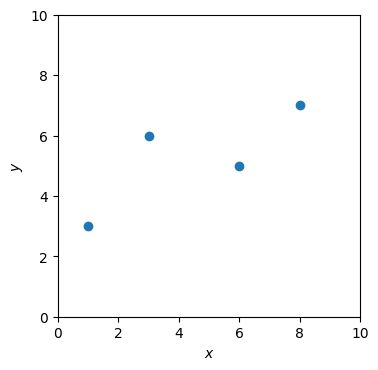

In [14]:
def draw_data(ax, D):
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 10)
    ax.set_aspect('equal')
    ax.scatter(D[:,0], D[:,1])
    
fig, ax = plt.subplots(dpi=100)
draw_data(ax, D)
plt.show()

```{margin} 損失値を事例数$N$で割る理由
これまでの説明では損失関数において$\frac{1}{N}$を省略していたが、この実装では損失値を事例数$N = |\mathcal{D}|$で割ったものを採用する（つまり、損失関数は二乗残差和ではなく平均二乗残差とする）。損失関数の値を定数倍するだけの違いであるため、損失値を$N$で割らなくても同じ解にたどり着くはずである。

ただ、以降で最急降下法と確率的勾配降下法が最小解に近づく速さを比較するとき、同じ学習率を用いて両者の挙動を揃えたいので、損失値を事例数で割る。最急降下法において損失値を事例数$N$で割らない場合、確率的勾配降下法において学習率が$N$倍されている状況に相当する。
```

パラメータ$a, b \in \mathbb{R}$を持つ一次関数$y = ax + b$に学習データ$\mathcal{D}$をフィッティングするには、以下の目的関数（平均二乗残差）を最小にする$a$と$b$を求めればよい。
\begin{align}
\hat{L}_{\mathcal{D}}(a,b) = \frac{1}{|\mathcal{D}|} \sum_{x, y \in \mathcal{D}} \left\{y - (ax + b)\right\}^2
\end{align}

$a$を横軸、$b$を縦軸として$\hat{L}_\mathcal{D}(a, b)$の値を$ab$平面上にヒートマップで描画した。$\hat{L}_{\mathcal{D}}(a,b)$の最小解$(a^*,b^*)$を式{eq}`eq:hat_a`と{eq}`eq:hat_b`で求め、×印で示してある。

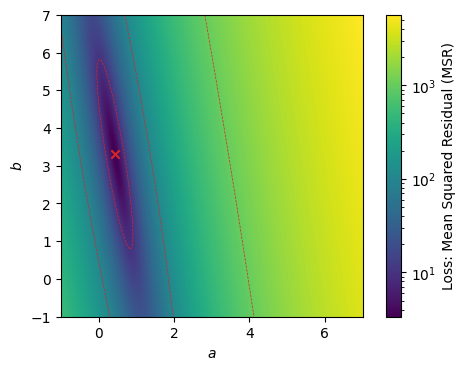

In [15]:
N = 1024
minvalue = 1e-6     # This prevents log 0 in the logarithmic scale.
mincontour = 1e-2   # Cut-off value for the contour plot.
A, B = np.meshgrid(np.linspace(-1, 7, N), np.linspace(-1, 7, N))

def compute_loss(x, y, a, b):
    return (y - (a * x + b)) **2

def compute_average_loss(D, a, b):
    return compute_loss(D[:,0], D[:,1], a, b).mean()

def compute_minimizer(X, Y):
    cov = np.cov(X, Y, bias=True)
    a = cov[0][1] / cov[0][0]
    b = np.mean(Y) - a * np.mean(X)
    return a, b

def draw_heatmap_with_contour(ax, fig, A, B, J, title='', colorbar=False):
    ax.set_aspect('equal')
    ax.set_xlabel('$a$')
    ax.set_ylabel('$b$')
    ax.set_title(title)
    
    # Draw a heatmap in the logarithmic scale for loss values.
    mesh = ax.pcolormesh(A, B, J, norm=matplotlib.colors.LogNorm(vmin=J.min(), vmax=J.max()), shading='auto')
    if colorbar:
        cbar = fig.colorbar(mesh, ax=ax)
        cbar.set_label('Loss: Mean Squared Residual (MSR)')
    
    # Draw a contour map (clip loss values not to draw lines in smaller area)
    ax.contour(A, B, np.clip(J, mincontour, None), vmin=1, norm=matplotlib.colors.LogNorm(vmin=J.min(), vmax=J.max()), colors='tab:red', linewidths=0.5, linestyles='dashed')
    
def plot_minimizer(ax, a, b):
    ax.scatter([a,], [b,], color='tab:red', marker='x')
    
fig, ax = plt.subplots(dpi=100)

losses = [compute_loss(D[i][0], D[i][1], A, B) + minvalue for i in range(len(D))]
draw_heatmap_with_contour(ax, fig, A, B, sum(losses), colorbar=True)
a_, b_ = compute_minimizer(D[:,0], D[:,1])
plot_minimizer(ax, a_, b_)
plt.show()

さて、$(a, b) = (0, 0)$を出発点として最急降下法を適用し、最小解に近づいていく様子をアニメーションで可視化する。現在の反復における$(a, b)$の値を$ab$平面上（左側）に、その$(a, b)$で回帰直線を引いたものを$xy$平面上（右側）に図示している。＋印は反復を開始する前の$(a,b)$の位置を表す。反復が進むにつれて、最小解$(a^*, b^*)$に近づいていくことが分かる。

In [16]:
max_epochs = 20000
record_period = 200
eta0 = 0.03

def generate_locus_animation(H, axab=None, axxy=None):
    A = []
    for j in range(0, len(H)):
        artists = []
        
        if axab:
            xmin, xmax = axab.get_xlim()
            ymin, ymax = axab.get_ylim()
            artists.append(axab.scatter([H[0]['a'],], [H[0]['b'],], color='white', marker='+'))
            artists.append(axab.text((xmin + xmax) / 2, ymin + 0.2, "Epoch #{}: MSE={:.5f}".format(H[j]['t'], H[j]['loss']), ha='center', color='black'))
            for i in range(0, j):
                artists += axab.plot([H[i]['a'], H[i+1]['a']], [H[i]['b'], H[i+1]['b']], color='white')
        
        if axxy:
            a, b = H[j]['a'], H[j]['b']
            x0, x1 = axxy.get_xlim()
            ymin, ymax = axxy.get_ylim()
            y0 = a * x0 + b
            y1 = a * x1 + b
            artists += axxy.plot([x0, x1], [y0, y1], ls='-', color='black', lw=1)
            artists.append(axxy.text((x0 + x1) / 2, ymin + 0.2, f'(a, b) = ({a:.5f}, {b:.5f})', ha='center', color='black'))
        
        A.append(artists)
    return A

def fill_loss_for_checkpoints(H):
    for h in H:
        h['loss'] = compute_average_loss(D, h['a'], h['b'])

X = np.vstack([D[:,0], np.ones_like(D[:,0])]).T
y = D[:,1]
w = np.zeros(X.shape[1])

H = []
H.append(dict(t=0, a=w[0], b=w[1]))
for t in range(max_epochs):
    eta = eta0 / np.sqrt(1+t)
    y_hat = X @ w
    grad = 2 * X.T @ (y_hat - y) / len(X)
    if np.sum(np.abs(grad)) < 1e-4:
        break
    w -= eta * grad
    if (t+1) % record_period == 0:
        H.append(dict(t=t+1, a=w[0], b=w[1]))
fill_loss_for_checkpoints(H)
     
fig, axs = plt.subplots(1, 2, dpi=100, figsize=(8, 4))
plt.subplots_adjust(wspace=0.25)

draw_data(axs[1], D)
J = sum(compute_loss(D[i][0], D[i][1], A, B) + minvalue for i in range(len(D)))
draw_heatmap_with_contour(axs[0], fig, A, B, J, colorbar=False)
a_, b_ = compute_minimizer(D[:,0], D[:,1])
plot_minimizer(axs[0], a_, b_)

artists = generate_locus_animation(H, axs[0], axs[1])
ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=50)
#ani.save('gd.mp4', writer="ffmpeg")
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

同様に、確率的勾配降下法が最小解に近づいていく様子をアニメーションで可視化する。反復の途中までは最急降下法と同じように解に近づいていくが、反復が進むにつれて解が小刻みに振動していることが確認できる。これは、確率的勾配降下法でモデルのパラメータを学習するときによく見かける現象である。パラメータの更新に使う勾配を一つの事例の勾配で近似するため、各反復で計算される勾配の間に齟齬が生じるのが原因である。ただ、解が振動しているとはいえ、訓練データに十分フィットしたパラメータを求めることができた。

In [17]:
max_epochs = 20000
record_period = 200
eta0 = 0.03

X = np.vstack([D[:,0], np.ones_like(D[:,0])]).T
y = D[:,1]
w = np.zeros(X.shape[1])

H = []
H.append(dict(t=0, a=w[0], b=w[1]))
for t in range(max_epochs):
    eta = eta0 / np.sqrt(1+t)
    i = np.random.randint(0, X.shape[0])
    y_hat = np.dot(X[i], w)
    grad = 2 * (y_hat - y[i]) * X[i]
    if np.sum(np.abs(grad)) < 1e-4:
        break
    w -= eta * grad
    if (t+1) % record_period == 0:
        H.append(dict(t=t+1, a=w[0], b=w[1]))
fill_loss_for_checkpoints(H)
        
fig, axs = plt.subplots(1, 2, dpi=100, figsize=(8, 4))

draw_data(axs[1], D)
J = sum(compute_loss(D[i][0], D[i][1], A, B) + minvalue for i in range(len(D)))
draw_heatmap_with_contour(axs[0], fig, A, B, J, colorbar=False)
a_, b_ = compute_minimizer(D[:,0], D[:,1])
plot_minimizer(axs[0], a_, b_)

artists = generate_locus_animation(H, axs[0], axs[1])
ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=50)
#ani.save('sgd.mp4', writer="ffmpeg")
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

では、なぜ確率的勾配降下法で勾配の計算を端折っても最小解に素早く近づくことができたのか？　その謎を解き明かすために、事例ごとに二乗残差を$ab$平面上に可視化する。一次関数$y = ax+b$へのフィッティングにおいて、ある事例$(x, y)$が与えられたとき、その事例の二乗残差$\hat{l}_{x,y}(a,b)$は、
\begin{align}
\hat{l}_{x,y}(a,b) = \left\{y - (ax + b)\right\}^2
\end{align}
以下の可視化において、×印は全訓練事例を用いた時の最小解の位置、＋印は反復を開始する前の$(a,b)$の初期位置を表す。なお、$(x, y)$の１点を通る回帰直線を無数に引くことができるため、二乗残差を最小（$0$）にする$(a, b)$の組み合わせも無数に存在する。そのため、海溝のようなヒートマップとなる。

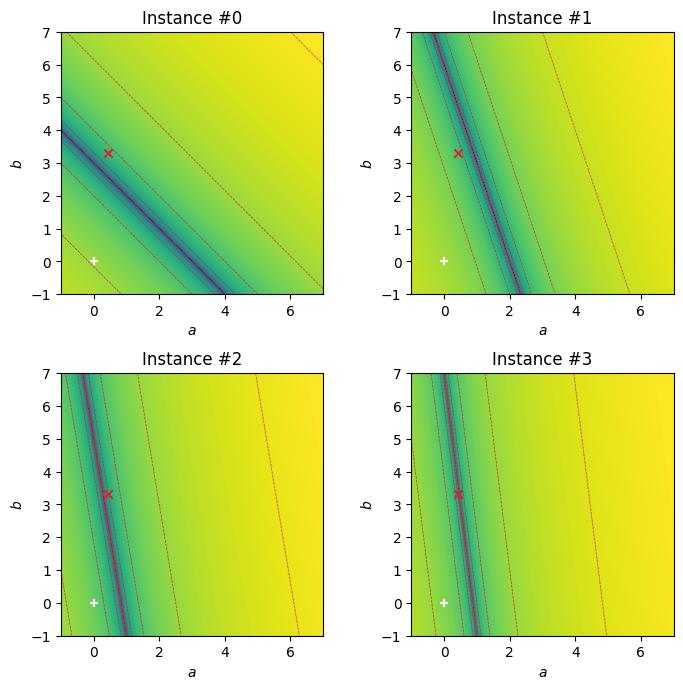

In [18]:
fig, axs = plt.subplots(2, 2, dpi=100, figsize=(8, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.3)

for i in range(len(D)):
    ax = axs[i // 2][i % 2]
    draw_heatmap_with_contour(ax, fig, A, B, losses[i], title=f'Instance #{i}')
    a_, b_ = compute_minimizer(D[:,0], D[:,1])
    plot_minimizer(ax, a_, b_)
    ax.scatter([0,], [0,], color='white', marker='+')

plt.show()

ここで、$(a,b)$の初期位置（＋印）の周辺に着目して欲しい。確率的勾配降下法がどの事例を選んだとしても、その勾配で最小解に近づくことができる。今回の実装では、学習率を$\eta = \frac{0.03}{\sqrt{1 + t}}$としている（$t$は反復の回数）ので、反復の初期段階では＋印の近くをゆっくり移動することになる。したがって、確率的勾配法の反復の初期段階では、一つの事例だけで勾配を計算したとしても、最適解に近づくことになる。ところが、解の位置が真の最小解に近づくと、各事例の勾配の向きと、全事例から計算した勾配の向きが揃わなくなり、解の動きが振動しやすくなる。確率的勾配降下法において、反復の初期段階では振動せずに最小解に向かうが、途中から振動を始めるのは、このような背景がある。

都合のよい訓練データと初期点を選んだからこのようになったと考える読者もいるかもしれない。しかし、解空間全体から見ると、ひとつの事例の勾配と全事例の勾配の向きがほぼ一致している領域は非常に広い。上で可視化した範囲でも、$a \leq 0$や$5 \leq a$の領域では、一つの事例と全事例の勾配の向きが同じ方向を向いている。

このことをより詳細に調べるため、$b$を$0$に固定し、横軸に$a$、縦軸に各事例の二乗残差、および全事例の平均二乗残差をプロットした。式{eq}`eq:loss-as-function-of-a-and-b`で示した通り、各事例の二乗残差は$a$の二次関数となるため、下に凸の形をしている。念のため、式{eq}`eq:loss-as-function-of-a-and-b`に$b=0$を代入した式を示す。
\begin{align}
\hat{L}_{x,y}(a) = x^2a^2 - 2xya + y^2
\end{align}
ゆえに、各事例$(x, y)$に対して、二乗残差を最小にする$a$の値は$\frac{y}{x}$である（原点と点$(x, y)$を通る直線を引くので、当然の結果と言える）。各事例および全事例に関して、最小解に対応する場所に、縦の点線を入れた。

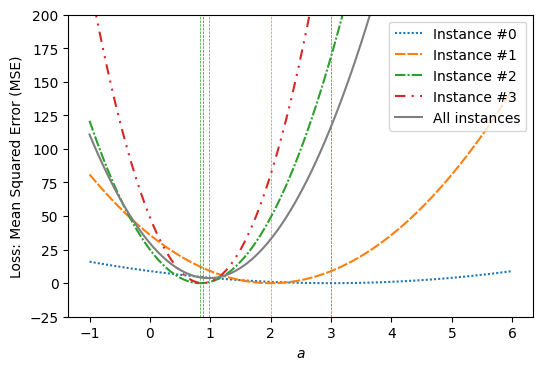

In [19]:
A = np.linspace(-1, 6, 100)
b = 0
linestyles = [(1, 1), (5, 1), (5, 1, 1, 1), (5, 3, 1, 3, 1, 3)]

def minimizer_of_a(D, b):
    x = D[:,0].mean()
    x2 = (D[:,0] ** 2).mean()
    xy = (D[:,0] * D[:,1]).mean()
    return (xy - x * b) / x2

fig, ax = plt.subplots(dpi=100)

losses = [compute_loss(D[i][0], D[i][1], A, b) for i in range(len(D))]

for i in range(len(D)):
    ax.plot(A, losses[i], ls=(0, linestyles[i]), color=f'C{i}', label=f"Instance #{i}")
    ax.axvline(x=minimizer_of_a(D[i:i+1], b), ls='--', color=f'C{i}', linewidth=0.5)

ax.plot(A, sum(losses) / len(losses), '-', color='tab:gray', label="All instances")
ax.axvline(x=minimizer_of_a(D, b), ls='--', color='tab:gray', linewidth=0.5)

ax.set_ylim(-25, 200)
ax.set_xlabel('$a$')
ax.set_ylabel('Loss: Mean Squared Error (MSE)')
plt.legend(loc='upper right')
plt.show()

このグラフを見ると、$a$が$a < \frac{5}{6}$もしくは$3 < a$の範囲にあるとき、どの事例を選んでもその事例の勾配の正負（向き）と全事例の勾配の正負が一致する。$a$が$\frac{5}{6} \leq a \leq 3$の範囲にあるとき、選ぶ事例によっては、勾配の向きに矛盾が生じてしまう。例えば、$a = 2$のときは、事例#0の勾配は負であるが、全事例の勾配は正である。

いま$b=0$に固定しているので、次のように考えてもよい。原点と訓練データの事例を結ぶ直線の中で、傾きが最小のものと最大のものを選び、それぞれ$a_{\rm min}, a_{\rm max}$とする。確率的勾配降下法で$a$を求めるとき、$a$が$a < a_{\rm min}$もしくは$a_{\rm max} < a$の範囲に存在するときは、どの事例を選んでも、その事例の勾配の正負と全事例の勾配の正負が一致する。今回用いている訓練データでは、$a$が$a < \frac{5}{6}$もしくは$3 < a$にあるとき、どの事例を選んでも勾配の正負が全事例の勾配の正負と一致する。

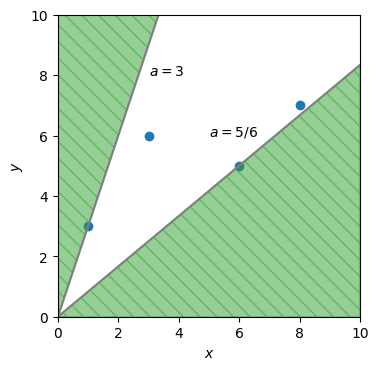

In [20]:
fig, ax = plt.subplots(dpi=100)
draw_data(ax, D)

x = np.arange(0, 10, 0.01)
y1 = 5 / 6 * x
y2 = 3 * x
ax.plot(x, y1, x, y2, color='tab:gray')
ax.text(5, 6, r'$a = 5 / 6$')
ax.text(3, 8, '$a = 3$')
ax.fill_between(x, 0, y1, color='tab:green', alpha=0.5, hatch="\\\\")
ax.fill_between(x, y2, 10, color='tab:green', alpha=0.5, hatch="\\\\")
plt.show()

もし訓練データにノイズが含まれており、$a_{\rm min} \leq a \leq a_{\rm max}$の範囲が広くなっている場合は、確率的勾配法の初期段階から解が振動してしまうかもしれない。ただ、回帰直線を求めるために用いられる訓練データでは、多くの事例から似たような傾きが計算されるはずで、一部のノイズ事例のみから大勢に反する傾きが計算されるはずである。ゆえに、確率的勾配降下法が訓練データからノイズ事例を選択する確率は低く抑えられていると考えれば、反復の初期段階で解が振動する回数も低く抑えられるので、さほど問題にはならない。例えば、以下に示した300件の訓練事例のうち、297件（丸印で表示）に対しては回帰直線を引きやすいが、残りの3件（星印で表示）はノイズと考えられる。確率的勾配降下法が丸印の事例を選択する確率は99%、ノイズの事例を選択する確率は1%である。ゆえに、確率的勾配降下法の初期段階からノイズ事例の勾配の影響を受けるかもしれないが、その影響は小さいと考えてよい。

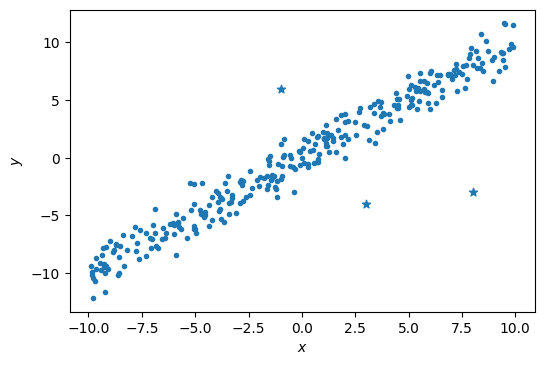

In [21]:
X = (np.random.rand(297) * 2 - 1) * 10
Y = X + np.random.randn(297)
nX = np.array([3, -1, 8])
nY = np.array([-4, 6, -3])

fig, ax = plt.subplots(dpi=100)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
#ax.set_aspect('equal')
ax.scatter(X, Y, marker='.', color='tab:blue')
ax.scatter(nX, nY, marker='*', color='tab:blue')
plt.show()

## オンライン学習とバッチ学習

最急降下法のように、すべての学習事例を処理してからパラメータを更新する方式を**バッチ学習**と呼ぶ。これに対し、小数の学習事例を処理してパラメータを更新する方式を**オンライン学習**と呼ぶ。

確率的勾配降下法の勾配の近似の精度を改善するには、ランダムに$1$個の事例を選ぶのではなく、事例をいくつか選んで勾配を計算すればよい。例えば、勾配計算に用いる事例数（**バッチサイズ**）をハイパーパラメータ$B$（$1 \leq B \leq N$）とし、$S(N, B)$を集合$\{1, 2, \dots, N\}$から$B$個の要素をランダムに選んだ集合を返す関数とすると、次式で勾配$\pmb{\delta}^{(t)}$を近似してもよい。
\begin{align}
\pmb{\delta}^{(t)}_{\rm MBSGD} = \sum_{i \in S(N, B)} 2 (\hat{y}_i^{(t)} - y_i) \pmb{x}_i
\end{align}
ここで、$B=N$のときはバッチ学習、$B=1$のときはオンライン学習となる。この両者の間、すなわち$1 < B < N$に設定してパラメータを更新する方式を**ミニバッチ学習**と呼ぶ。ミニバッチ学習は勾配の近似精度を改善する目的以外にも、並列計算で学習を高速化するときによく用いられるテクニックである。

## 確認問題

**(1) リッジ回帰モデルを学習する反復式の導出**

確率的勾配降下法でリッジ回帰モデルを学習したい。確率的勾配降下法の反復式を導出せよ。

**(2) $L_2$正則化を反復式から解釈する**

リッジ回帰では、学習中にパラメータベクトルの$L_2$ノルムが大きくなりすぎないように制御する。(1)で導出した反復式から、パラメータベクトルが大きくなりすぎるのを防ぐメカニズムを説明せよ。

**(3) リッジ回帰の実装**

確率的勾配降下法でリッジ回帰のパラメータを推定するアルゴリズムを実装し、以下のデータに対して多項式近似の曲線を求めよ。ただし、便利なモジュール等は使わずに、この資料で説明した式・アルゴリズムをプログラムとして表現すること。多項式近似の次数やリッジ回帰の係数$\alpha$などのハイパーパラメータは適当に設定せよ。

In [22]:
X = np.array([ 0.  ,  0.16,  0.22,  0.34,  0.44,  0.5 ,  0.67,  0.73,  0.9 ,  1.  ])
Y = np.array([-0.06,  0.94,  0.97,  0.85,  0.25,  0.09, -0.9 , -0.93, -0.53,  0.08])

---

[機械学習帳](https://chokkan.github.io/mlnote/) © Copyright 2020-2021 by [岡崎 直観 (Naoaki Okazaki)](https://www.chokkan.org/). この作品は<a rel="license" href="http://creativecommons.org/licenses/by-nc-nd/4.0/">クリエイティブ・コモンズ 表示 - 非営利 - 改変禁止 4.0 国際 ライセンス</a>の下に提供されています。 <a rel="license" href="http://creativecommons.org/licenses/by-nc-nd/4.0/"><img alt="クリエイティブ・コモンズ・ライセンス" style="border-width:0" src="https://i.creativecommons.org/l/by-nc-nd/4.0/80x15.png" /></a>　ただし、作品中のコードセル部分は<a rel="license" href="https://opensource.org/licenses/MIT">MITライセンス</a>の下に提供されています。